In [1]:
import pandas as pd
import os
os.environ['USE_PYGEOS'] = '0'
import geopandas as gpd
import numpy as np

# matplotlib
import matplotlib.pyplot as plt
from matplotlib_scalebar.scalebar import ScaleBar
from matplotlib.patches import Circle
import matplotlib.dates as mdates
%matplotlib inline

import datetime

import contextily as cx

import seaborn as sns
import os
from tqdm import tqdm

import shapely
from shapely.geometry import LineString, Point
from collections import Counter

import iteround

from sklearn.neighbors import KDTree
import importlib
from scipy.interpolate import griddata

/cluster/apps/nss/gcc-6.3.0/python/3.8.5/x86_64/lib64/python3.8/site-packages/pyproj/__init__.py:78: UserWarning: Valid PROJ data directory not found. Either set the path using the environmental variable PROJ_LIB or with `pyproj.datadir.set_data_dir`.
  warnings.warn(str(err))


In [2]:
tqdm.pandas(desc='My bar!')

/cluster/apps/nss/gcc-6.3.0/python/3.8.5/x86_64/lib64/python3.8/site-packages/tqdm/std.py:706: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


In [3]:
import utils
importlib.reload(utils)
import plotting_utils
importlib.reload(plotting_utils)
import euler_utils
importlib.reload(euler_utils)

<module 'euler_utils' from '/cluster/home/mfrancesc/IVT/eqasim-java/switzerland/Analysis_notebooks/euler_utils.py'>

In [4]:
zurich_shp_path = '/cluster/work/ivt_vpl/mfrancesc/ScenarioBoundary/zurich_city_5km.shp'
# get lakes
lake_path = "/cluster/work/ivt_vpl/mfrancesc/lake/g1s20.shp"
zurich_districts_path = "/cluster/work/ivt_vpl/mfrancesc/city_districts/data/stzh.adm_stadtkreise_v.shp"
df_districts = plotting_utils.get_zurich_districts_gpd(zurich_districts_path)



In [5]:
main_folder = '/cluster/work/ivt_vpl/mfrancesc/SA_scenario/'
last_iter = 50

output_data = euler_utils.read_output(main_folder + 'no_rejections_4000_10_pct_average_shapefile')

100%|██████████| 51/51 [00:32<00:00,  1.59it/s]


In [6]:
it_drt_legs_gpd = utils.convert_drt_legs_to_gpd(output_data['drt_legs'][last_iter])
it_drt_trips_stats_gpd = utils.convert_drt_legs_to_gpd(output_data['drt_trips_stats'][last_iter])

# Division in time bins

In [7]:
bin_duration_min = 180 # Duration of the time bins in minutes
start_time_h = 0
end_time_h = 24

In [8]:
trips = it_drt_trips_stats_gpd.copy(deep=True)

n_bins = (end_time_h - start_time_h) * 60 // bin_duration_min
bins = [start_time_h*3600 + i*bin_duration_min*60 for i in range(0,n_bins+1)]
trips['time_bin'] = pd.cut(trips.startTime, bins).map(lambda x: str(x.left/3600) + 'h - ' + str(x.right/3600) + 'h')

In [9]:
trips.time_bin.value_counts()

15.0h - 18.0h    45178
12.0h - 15.0h    37852
6.0h - 9.0h      31882
9.0h - 12.0h     31476
18.0h - 21.0h    29820
21.0h - 24.0h    10578
3.0h - 6.0h       2735
0.0h - 3.0h        163
Name: time_bin, dtype: int64

In [10]:
def compute_avg_wait_time_for_point(trips, point, time_bin, distance_limit = 1000):
    filtered = trips.copy(deep=True)
    filtered = filtered[filtered.time_bin == time_bin]
    assert isinstance(point, Point)
    filtered['distance'] = gpd.GeoSeries(filtered.origin_geometry).distance(point)
    filtered = filtered[filtered['distance'] <= distance_limit]
    
    return filtered.waitTime.mean() / 60

In [11]:
def plot_multiple_time_bins(trips, distance_limit, vmin=None, vmax=None):
    points = utils.get_even_spaced_points_from_shapefile(zurich_shp_path, 500)
    plt.figure(figsize=(20,40))
    for idx, time_bin in enumerate(trips.time_bin.cat.categories, start=1):
        copy_points = points.copy(deep=True)
        copy_points['waitTime'] = copy_points.progress_apply(lambda x: compute_avg_wait_time_for_point(trips, x.geometry,time_bin,distance_limit=distance_limit), axis=1)
        plt.subplot(4,2,idx)
        ax = plt.gca()
        copy_points.crs = "epsg:2056"
        copy_points.plot(ax=ax,column='waitTime', legend=True, markersize=20, vmin=vmin, vmax=vmax, legend_kwds={'label': "WaitTime (min)"}, cmap='plasma')
        plt.title(time_bin)
        plt.xticks([])
        plt.yticks([])
        cx.add_basemap(ax=ax, crs="epsg:2056")
    plt.show()


My bar!: 100%|██████████| 1531/1531 [01:27<00:00, 17.57it/s]


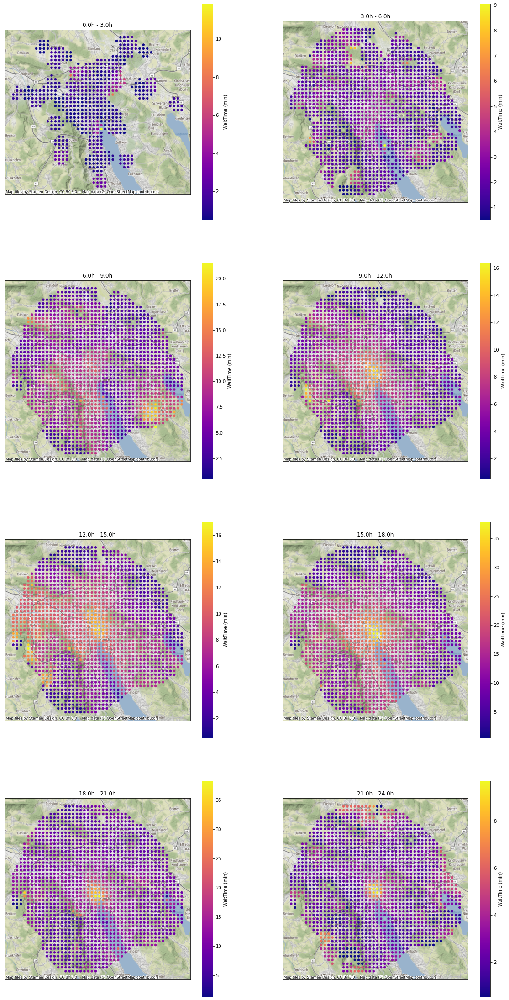

In [12]:
plot_multiple_time_bins(trips, 1000)

We see that in some plots there are some points where the waiting time is really high compared to the rest and this makes the plot not represent well the distribution, this is probably because in that area there are really few trips at that time and then there's high variance in the waiting time, to solve this in the representation we use vmin and vmax but this would still not fix it in the simulation if this method is applied.

My bar!: 100%|██████████| 1531/1531 [01:22<00:00, 18.56it/s]


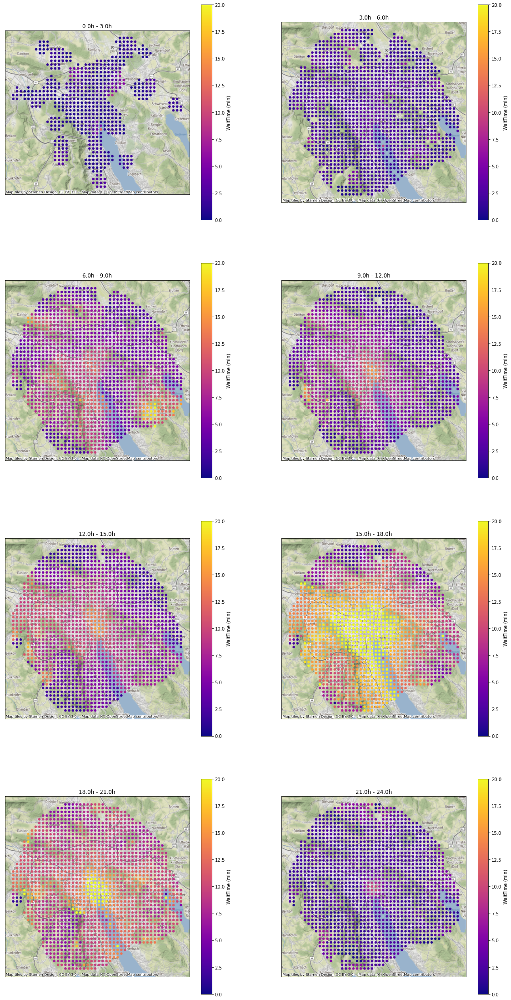

In [13]:
plot_multiple_time_bins(trips, 1000, vmin=0, vmax = 20)

In [14]:
trips.time_bin.cat.categories

Index(['0.0h - 3.0h', '3.0h - 6.0h', '6.0h - 9.0h', '9.0h - 12.0h',
       '12.0h - 15.0h', '15.0h - 18.0h', '18.0h - 21.0h', '21.0h - 24.0h'],
      dtype='object')

We try using knn to check if this fixes the high variance at some points (instead of using the points that are within a distance limit we use the k nearest points)

In [15]:
def compute_avg_wait_time_for_point_with_knn(trips, point, time_bin, n_neighbors = 100):
    filtered = trips.copy(deep=True)
    filtered = filtered[filtered.time_bin == time_bin]
    assert isinstance(point, Point)
    filtered['distance'] = gpd.GeoSeries(filtered.origin_geometry).distance(point)
    filtered = filtered.sort_values(by='distance')
    if n_neighbors < 1:
        n_neighbors = int(n_neighbors * filtered.shape[0])
    return filtered.head(n_neighbors).waitTime.mean() / 60
    

In [16]:
def plot_multiple_time_bins_knn(trips, n_neighbors, vmin=None, vmax=None):
    points = utils.get_even_spaced_points_from_shapefile(zurich_shp_path, 500)
    plt.figure(figsize=(20,40))
    for idx, time_bin in enumerate(trips.time_bin.cat.categories, start=1):
        copy_points = points.copy(deep=True)
        copy_points['waitTime'] = copy_points.progress_apply(lambda x: compute_avg_wait_time_for_point_with_knn(trips, x.geometry,time_bin,n_neighbors=n_neighbors), axis=1)
        plt.subplot(4,2,idx)
        ax = plt.gca()
        copy_points.crs = "epsg:2056"
        copy_points.plot(ax=ax,column='waitTime', legend=True, markersize=20, vmin=vmin, vmax=vmax, legend_kwds={'label': "WaitTime (min)"}, cmap='plasma')
        plt.title(time_bin)
        plt.xticks([])
        plt.yticks([])
        cx.add_basemap(ax=ax, crs="epsg:2056")
    plt.show()

My bar!: 100%|██████████| 1531/1531 [01:35<00:00, 16.00it/s]


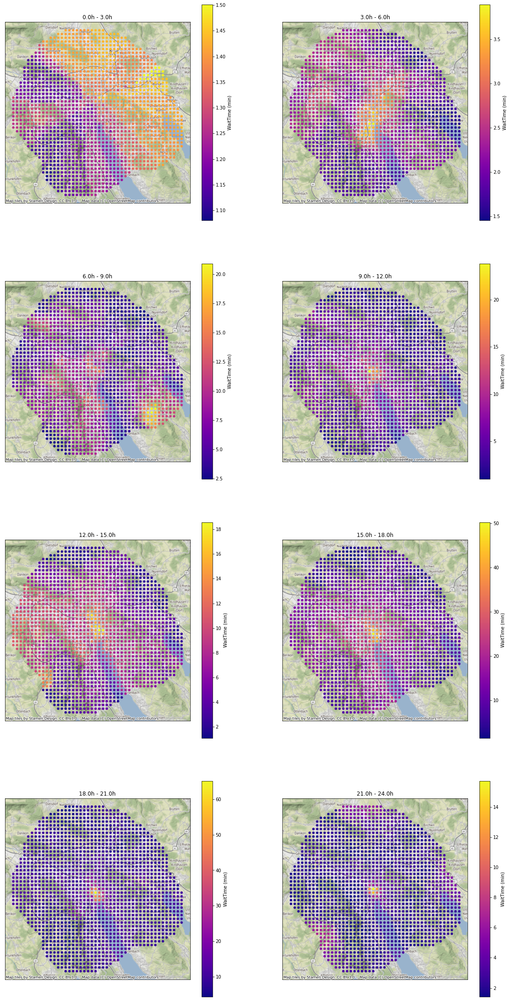

In [17]:
plot_multiple_time_bins_knn(trips, 100)

We see that using a fixed number of neighbors does not work well, we try using a percentage of the trips in that time bin.

My bar!: 100%|██████████| 1531/1531 [01:35<00:00, 16.00it/s]


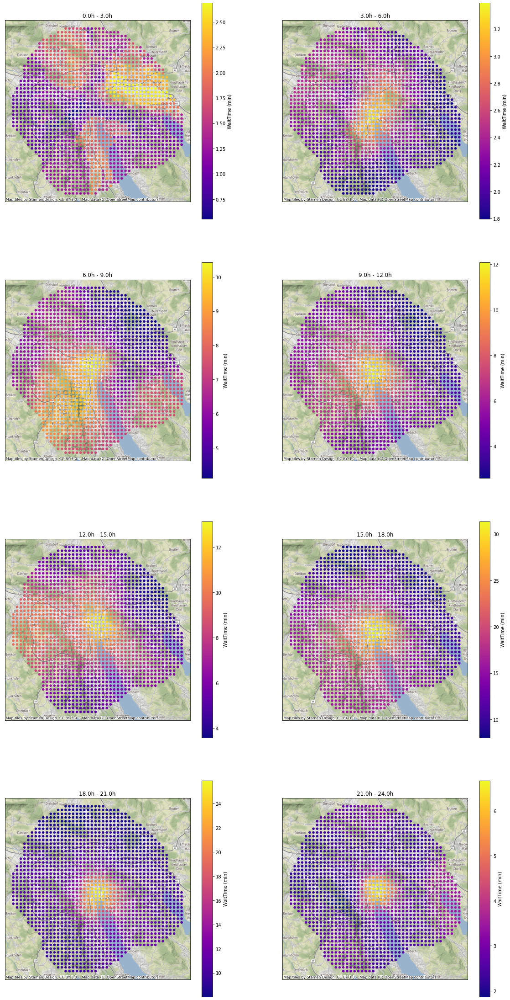

In [18]:
plot_multiple_time_bins_knn(trips, 0.1)

We can see that using a variable number of neighbors solves a little bit the problem (especially for the time bins with high number of trips), for the time bins with lower number of trip it still uses maybe too much trips but I thinbk it should not be a problem, we test with different percentage of trips:

My bar!: 100%|██████████| 1531/1531 [01:37<00:00, 15.67it/s]


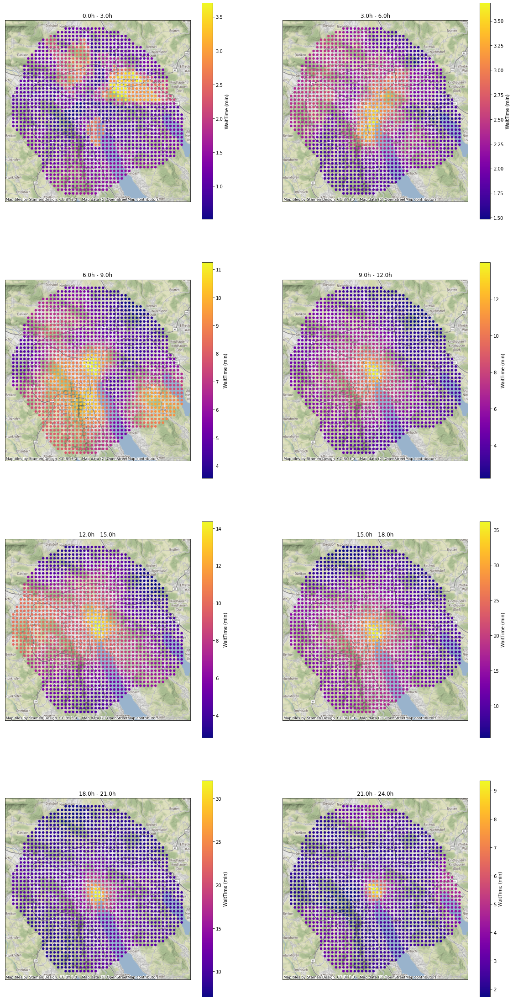

In [19]:
plot_multiple_time_bins_knn(trips, 0.05)

My bar!: 100%|██████████| 1531/1531 [01:35<00:00, 16.00it/s]


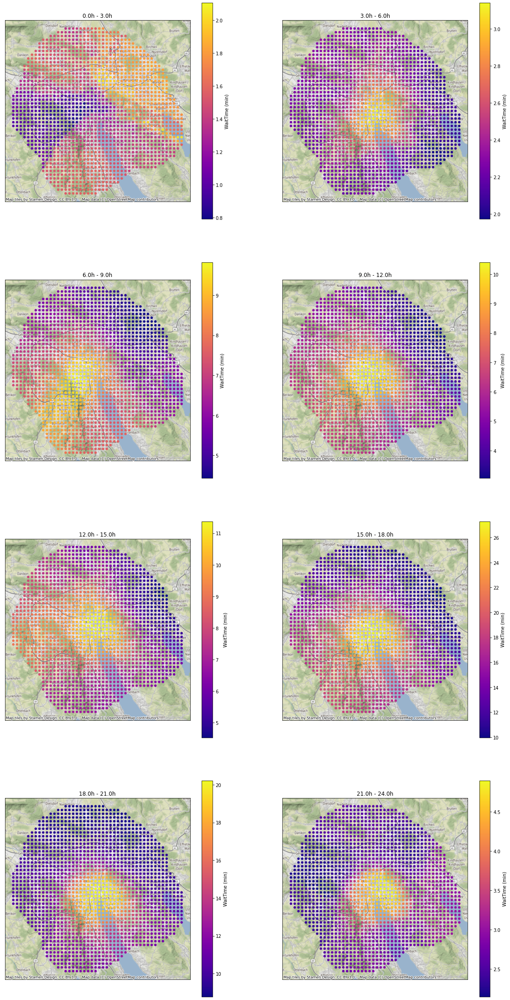

In [20]:
plot_multiple_time_bins_knn(trips, 0.2)

Plot it with smaller time bins 15-30 min

base time bin + limit time bin
Add weight decay -> need to choose if 1/s^2, 1/s or exponential -> accessibility decay distance fucntion
Plot the fixed zones with time bins
Execute it and compare if it optimistic or pessimistic all of them